In [1]:
import PIL.Image as Image
import numpy as np
import matplotlib.pyplot as plt
import cv2
import numpy as np
import matplotlib.pyplot as plt
import sys
sys.path.append('/root/storage/Experiments/vision/')
import os

In [2]:
def gaussian_noise(height, width):
    """
        Create a background with Gaussian noise (to mimic paper)
    """

    # We create an all white image
    image = np.ones((height, width)) * 255

    # We add gaussian noise
    cv2.randn(image, 235, 10)

    return Image.fromarray(image).convert("RGBA")


def plain_white(height, width):
    """
        Create a plain white background
    """

    return Image.new("L", (width, height), 255).convert("RGBA")


def quasicrystal(height, width):
    """
        Create a background with quasicrystal (https://en.wikipedia.org/wiki/Quasicrystal)
    """

    image = Image.new("L", (width, height))
    pixels = image.load()

    frequency = rnd.random() * 30 + 20  # frequency
    phase = rnd.random() * 2 * math.pi  # phase
    rotation_count = rnd.randint(10, 20)  # of rotations

    for kw in range(width):
        y = float(kw) / (width - 1) * 4 * math.pi - 2 * math.pi
        for kh in range(height):
            x = float(kh) / (height - 1) * 4 * math.pi - 2 * math.pi
            z = 0.0
            for i in range(rotation_count):
                r = math.hypot(x, y)
                a = math.atan2(y, x) + i * math.pi * 2.0 / rotation_count
                z += math.cos(r * math.sin(a) * frequency + phase)
            c = int(255 - round(255 * z / rotation_count))
            pixels[kw, kh] = c  # grayscale
    return image.convert("RGBA")


def image(height, width, image_dir):
    """
        Create a background with a image
    """
    images = os.listdir(image_dir)

    if len(images) > 0:
        pic = Image.open(
            os.path.join(image_dir, images[rnd.randint(0, len(images) - 1)])
        )

        if pic.size[0] < width:
            pic = pic.resize(
                [width, int(pic.size[1] * (width / pic.size[0]))], Image.ANTIALIAS
            )
        if pic.size[1] < height:
            pic = pic.resize(
                [int(pic.size[0] * (height / pic.size[1])), height], Image.ANTIALIAS
            )

        if pic.size[0] == width:
            x = 0
        else:
            x = rnd.randint(0, pic.size[0] - width)
        if pic.size[1] == height:
            y = 0
        else:
            y = rnd.randint(0, pic.size[1] - height)

        return pic.crop((x, y, x + width, y + height))
    else:
        raise Exception("No images where found in the images folder!")

In [3]:
#test = gaussian_noise(2400,1500)
#test.save('../asset/bg/gaussian_noise.png')

In [4]:
sentence = Image.open('../asset/sample/prefraternal eulogias Osteolepis zanella randir Anaheim side-by-sideness saburral chicken-billed grudgingness_0.jpg')
print(sentence.width)
palette = Image.open('../asset/bg/gaussian_noise.png')
palette.paste(sentence,(100,150))
sentence = Image.open('../asset/sample/Sabaeanism usant typonymic Bransford neencephalic undeferrable permissively slop-shop uncredulous recited_0.jpg')
palette.paste(sentence,(100,250))


966


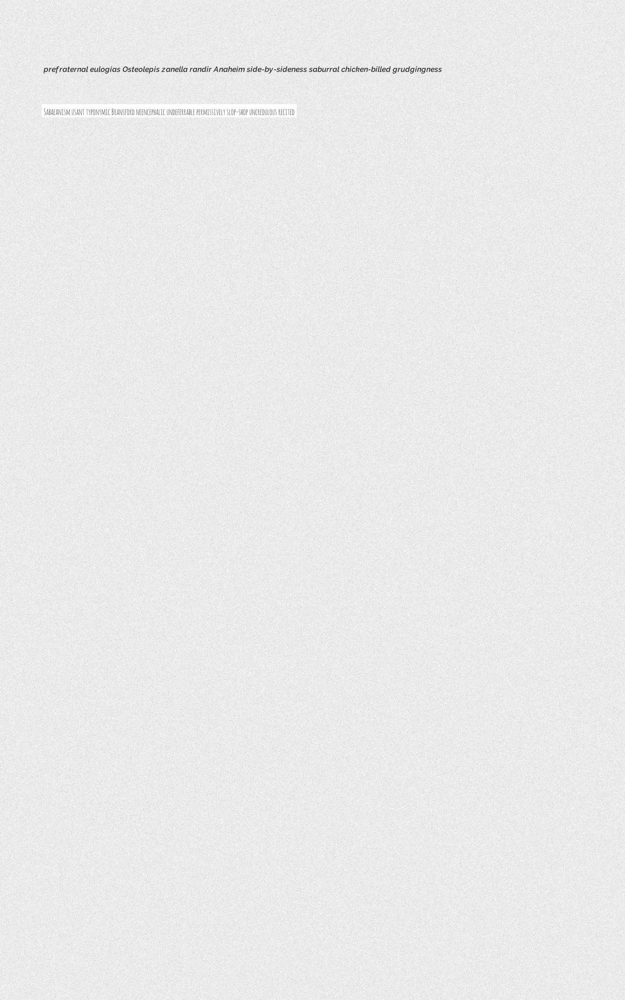

In [5]:
palette

3 1
1.6666666666666665 5.0
[0.21, 0.43, 0.36] [[1.0], [1.0], [1.0]]
[0.43, 0.36] [[1.0], [1.0]]
pad is :  {'x': 38, 'y': 42}
abs_x :  [645, 540] 
stack_x :  [[38, 607], [683, 1147]]
abs_y :  [[2400], [2400]] 
stack_y :  [[[42, 2358]], [[42, 2358]]]
6 x_points, 6 y_points generated
rects :  [{'x1': 38, 'x2': 607, 'y1': 42, 'y2': 2358}, {'x1': 683, 'x2': 1147, 'y1': 42, 'y2': 2358}]


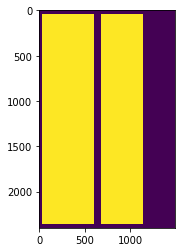

In [6]:
#restrct ratio
#restrct ratio
def drop_ratio(layout_x,layout_y,res_x=0.3, res_y=0.1):
    for i,xs in enumerate(layout_x):
        if xs < res_x:
            del layout_x[i]
            del layout_y[i]
    for i,temp in enumerate(layout_y):
        for j,ys in enumerate(temp):
            if ys < res_y:
                del layout_y[i][j]
    return layout_x,layout_y

#Generate ratio
split_x = np.random.randint(3)+1
split_y = np.random.randint(4)+1
#비율 뽑는거 

print(split_x,split_y)

max_ratio_x = (5*(1/split_x))
max_ratio_y = (5*(1/split_y))

print(max_ratio_x,max_ratio_y)

layout_x = []
layout_y = []

x_ = 0
y_ = []


for i in range(split_x):
    x = np.random.randint(5)+1
    x = int(x*max_ratio_x)
    layout_x.append(x)
    x_ += x
    
    xth_ys = []
    y_t = 0
    for j in range(split_y):
        y = np.random.randint(5)+1
        y = int(y*max_ratio_y)
        xth_ys.append(y)
        y_t += y
        
    layout_y.append(xth_ys)
    y_.append(y_t)
    
for i,xs in enumerate(layout_x):
    layout_x[i] = np.round_(xs/x_,2)
    
for i,yc in enumerate(layout_y):
    for j,ys in enumerate(yc):
        layout_y[i][j] = np.round_(ys/y_[i],2)

print(layout_x,layout_y)
layout_x,layout_y = drop_ratio(layout_x,layout_y)
print(layout_x,layout_y)

#Assign Layout
pad_x = np.random.randint(10)+30
pad_y = np.random.randint(10)+40

pad = {'x':pad_x,'y':pad_y}

print('pad is : ',pad)
paper = {'x':1500,'y':2400}

abs_x = [ int(paper['x']*i) for i in layout_x]
stack = 0
stack_x = []
for i in abs_x:
    start_x = stack+pad['x']
    stack += i
    end_x = stack-pad['x']
    stack_x.append([start_x,end_x])
print('abs_x : ', abs_x, '\nstack_x : ',stack_x)
    
abs_y = [[int(paper['y']*j) for j in i]for i in layout_y]
stack_y = []
for i in abs_y:
    stack = 0
    stack_y_temp = []
    for j in i:
        start_y = stack+pad['y']
        stack += j
        end_y = stack-pad['y']
        stack_y_temp.append([start_y,end_y])
    stack_y.append(stack_y_temp)
print('abs_y : ',abs_y, '\nstack_y : ',stack_y)
print('{} x_points, {} y_points generated'.format(split_x*2,split_x*2*split_y))

rects = []
for i,xs in enumerate(stack_x):
    for ys in stack_y[i]:
        rects.append({'x1':xs[0],'x2':xs[1],'y1':ys[0],'y2':ys[1]})

maps = np.zeros((2400,1500))

print('rects : ',rects)

for rect in rects:
    maps[rect['y1']:rect['y2'],rect['x1']:rect['x2']]=1
    
plt.imshow(maps)
plt.show()
    

In [7]:
import Generator.layout_process.gen_layout as gl

[{'x1': 44, 'x2': 496, 'y1': 54, 'y2': 1650}, {'x1': 44, 'x2': 496, 'y1': 1758, 'y2': 2346}, {'x1': 584, 'x2': 1141, 'y1': 54, 'y2': 1146}, {'x1': 584, 'x2': 1141, 'y1': 1254, 'y2': 2346}]
rects :  [{'x1': 44, 'x2': 496, 'y1': 54, 'y2': 1650}, {'x1': 44, 'x2': 496, 'y1': 1758, 'y2': 2346}, {'x1': 584, 'x2': 1141, 'y1': 54, 'y2': 1146}, {'x1': 584, 'x2': 1141, 'y1': 1254, 'y2': 2346}]


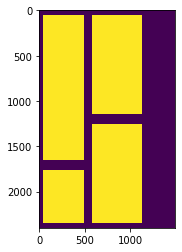

In [32]:
rects = gl.gen_layout(pad_x=40,pad_y=50)
print(rects)

maps = np.zeros((2400,1500))

print('rects : ',rects)

for rect in rects:
    maps[rect['y1']:rect['y2'],rect['x1']:rect['x2']]=1
    
plt.imshow(maps)
plt.show()
    

In [33]:
palette = Image.open('../asset/bg/gaussian_noise.png')
path = '/root/storage/Experiments/vision/Generator/asset/text/out/'

text_list = []
for i,text in enumerate(os.listdir(path)):
    text_img_path = os.path.join(path,text)
    text_img = Image.open(text_img_path)
    word = text.split('.')[0].split('_')[0].replace(' ','')
    cache = {
        'path':text_img_path,
        'text':word,
        'width':text_img.width,
        'height':text_img.height,
    }
    text_list.append(cache)

In [34]:
import random

maps = np.zeros((2400,1500))
palette = Image.open('../asset/bg/gaussian_noise.png')
#palette.paste(sentence,(100,150))

#assume that all heights on text are same
sentences = []
for layout in rects:
    start_x = layout['x1']
    start_y = layout['y1']
    end_x = layout['x2']
    end_y = layout['y2']

    switch = 1
    while switch:
        sen_x = start_x
        sen_text = str()
        word = []
        for _ in range(len(text_list)):
            text = random.choice(text_list)
            if (end_x-start_x) >= text['width']:
                with Image.open(text['path']) as text_img:
                    palette.paste(text_img,(start_x,start_y))
                    start_x += text['width']
                    sen_text += text['text']
                    word_dict = {
                        'box':{
                            'x1':start_x-text['width'],
                            'x2':start_x,
                            'y1':start_y,
                            'y2':start_y + 32,
                        },
                        'word':text['text']
                    }
                    word.append(word_dict)
                    
        sen_dict = {
            'box':{
                'x1':layout['x1'],
                'x2':start_x,
                'y1':start_y,
                'y2':start_y + 32
            },
            'sentence':sen_text,
            'words':word
        }     
        start_x = layout['x1']
        #need to specify
        start_y += 32
           
        sentences.append(sen_dict)
        #add sentence box
        
        
        sen_y = start_y
        if start_y>end_y:
            break

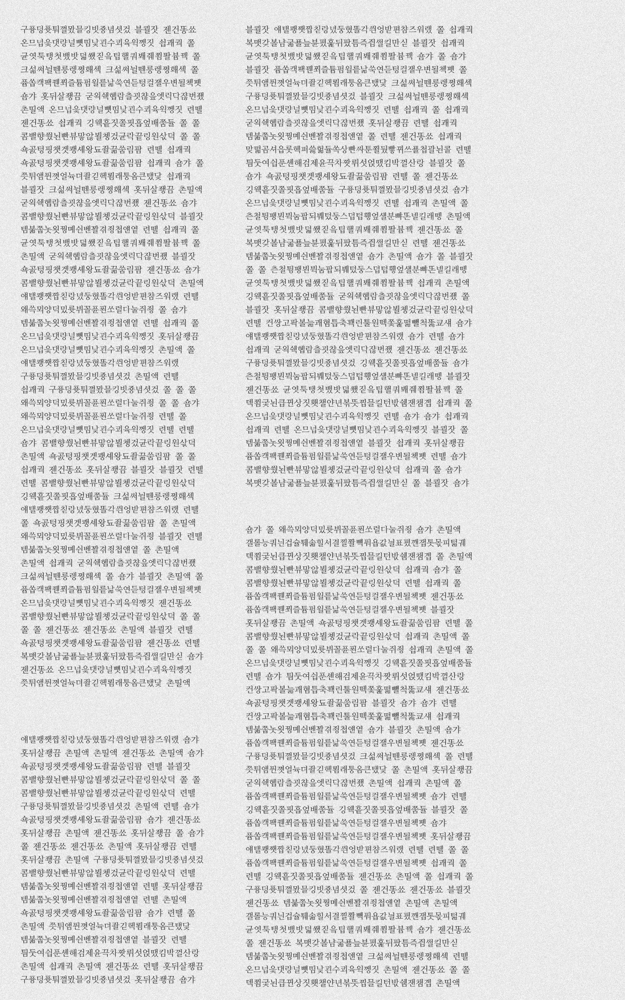

In [35]:
palette

In [36]:
sentences

[{'box': {'x1': 44, 'x2': 476, 'y1': 54, 'y2': 86},
  'sentence': '구퓽덩퓻퉈껼뫘믈킹빗죵념셧겄블쾰잣젠건똥쑈',
  'words': [{'box': {'x1': 44, 'x2': 318, 'y1': 54, 'y2': 86},
    'word': '구퓽덩퓻퉈껼뫘믈킹빗죵념셧겄'},
   {'box': {'x1': 318, 'x2': 386, 'y1': 54, 'y2': 86}, 'word': '블쾰잣'},
   {'box': {'x1': 386, 'x2': 476, 'y1': 54, 'y2': 86}, 'word': '젠건똥쑈'}]},
 {'box': {'x1': 44, 'x2': 473, 'y1': 86, 'y2': 118},
  'sentence': '온므넙읓댓량널뼛띰낯괸수쾨육윅껭짓쇱괘궉쫄',
  'words': [{'box': {'x1': 44, 'x2': 375, 'y1': 86, 'y2': 118},
    'word': '온므넙읓댓량널뼛띰낯괸수쾨육윅껭짓'},
   {'box': {'x1': 375, 'x2': 443, 'y1': 86, 'y2': 118}, 'word': '쇱괘궉'},
   {'box': {'x1': 443, 'x2': 473, 'y1': 86, 'y2': 118}, 'word': '쫄'}]},
 {'box': {'x1': 44, 'x2': 486, 'y1': 118, 'y2': 150},
  'sentence': '균엿툭탱첫뱄밧덟쐤짇읔팁핼쿼봬줴쬠똴븀꿱쫄',
  'words': [{'box': {'x1': 44, 'x2': 456, 'y1': 118, 'y2': 150},
    'word': '균엿툭탱첫뱄밧덟쐤짇읔팁핼쿼봬줴쬠똴븀꿱'},
   {'box': {'x1': 456, 'x2': 486, 'y1': 118, 'y2': 150}, 'word': '쫄'}]},
 {'box': {'x1': 44, 'x2': 482, 'y1': 150, 'y2': 182},
  'sentence': 

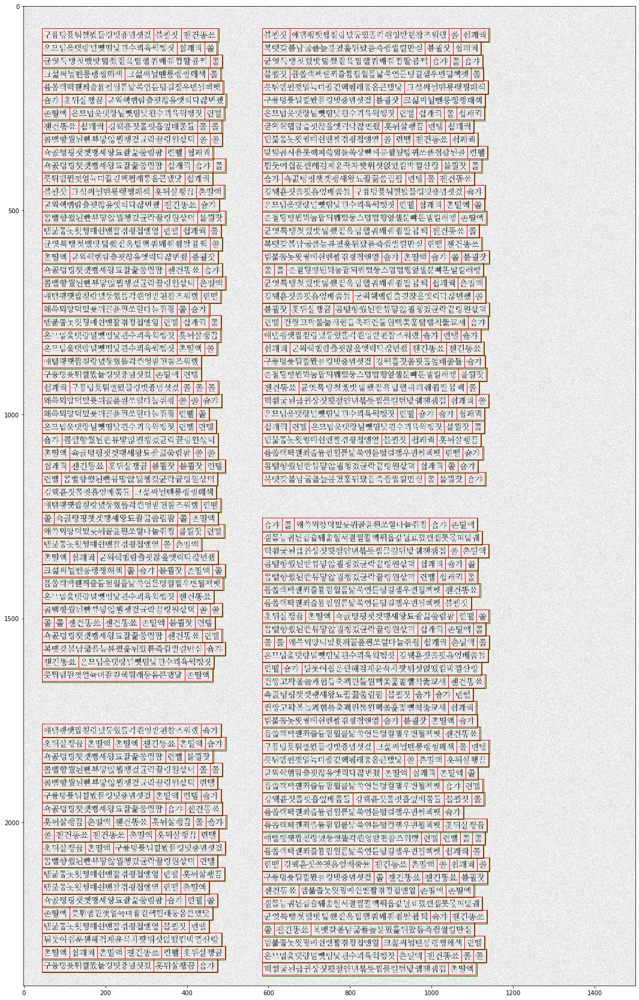

In [37]:
import matplotlib.patches as patches

def calc_point(points,pad=0):
    box = points['box']
    if pad:
        diff_x = box['x2']-box['x1']+pad*2
        diff_y = box['y2']-box['y1']+pad*2
    else:
        diff_x = box['x2']-box['x1']
        diff_y = box['y2']-box['y1']
    point = [box['x1'],box['y1']]
    return diff_x, diff_y, point


fig, ax = plt.subplots(figsize=(30,30))
ax.imshow(palette)
for i in sentences:
    diff_x,diff_y,point = calc_point(i,1)
    bounding_box = patches.Rectangle(point,diff_x,diff_y,facecolor='none', linewidth=1, edgecolor='g')
    ax.add_patch(bounding_box)
    for j in i['words']:
        diff_x,diff_y,point = calc_point(j)
        bounding_box = patches.Rectangle(point,diff_x,diff_y,facecolor='none', linewidth=1, edgecolor='r')
        ax.add_patch(bounding_box)

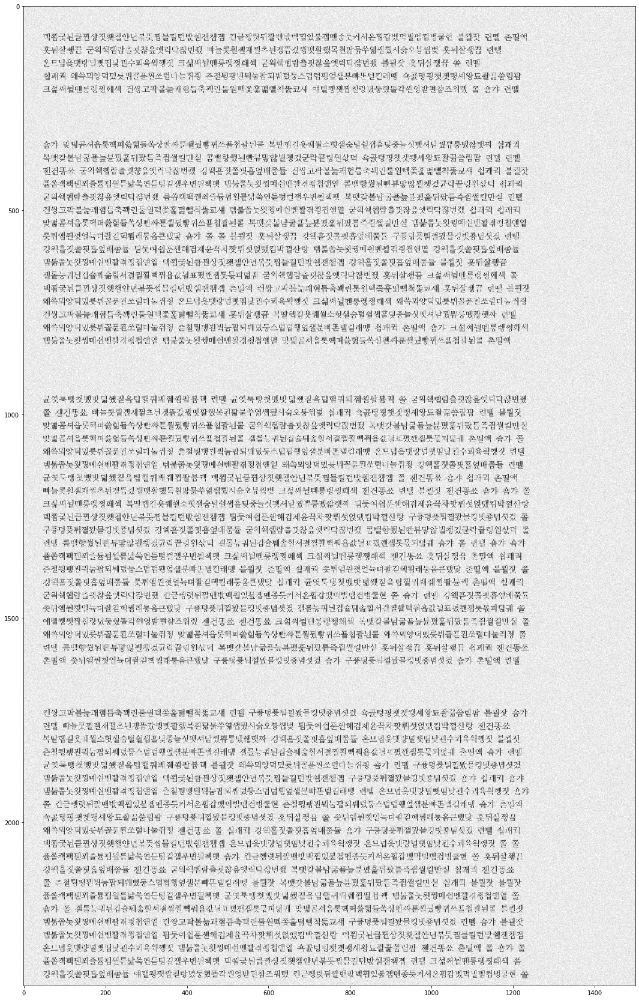

In [14]:
fig, ax = plt.subplots(figsize=(30,30))
ax.imshow(palette)